In [4]:
import matplotlib.pyplot as plt
from datetime import datetime
import numpy as np

In [5]:
import pandas as pd

#Export AZ, ELEV and SNR from RTKLIB to a txt file
# read text file into pandas DataFrame (extra white space)
RoverFile = pd.read_fwf('Data/SNR_EL_MP_0degGPS_rover29_5.txt')
RoverFile.head()

,% TIME (GPST),SAT,AZ(deg),EL(deg),SNR(dBHz),L1/LC MP(m)
0,2022/05/29 13:51:35.4,G01,279.1,12.3,41.2,0.0
1,2022/05/29 13:51:36.4,G01,279.1,12.3,40.1,0.0
2,2022/05/29 13:51:37.4,G01,279.1,12.3,40.3,0.0
3,2022/05/29 13:51:38.4,G01,279.1,12.3,40.9,0.0
4,2022/05/29 13:51:39.4,G01,279.1,12.3,39.7,0.0


In [6]:
BaseFile = pd.read_fwf('Data/SNR_EL_MP_0degGPS_Base29_5.txt')
BaseFile.head()

,% TIME (GPST),SAT,AZ(deg),EL(deg),SNR(dBHz),L1/LC MP(m)
0,2022/05/29 14:00:00.0,G01,282.9,13.2,0.0,0.4286
1,2022/05/29 14:00:01.0,G01,282.9,13.2,0.0,0.3145
2,2022/05/29 14:00:02.0,G01,282.9,13.2,0.0,0.0915
3,2022/05/29 14:00:03.0,G01,282.9,13.2,0.0,-0.1669
4,2022/05/29 14:00:04.0,G01,282.9,13.2,0.0,-0.6293


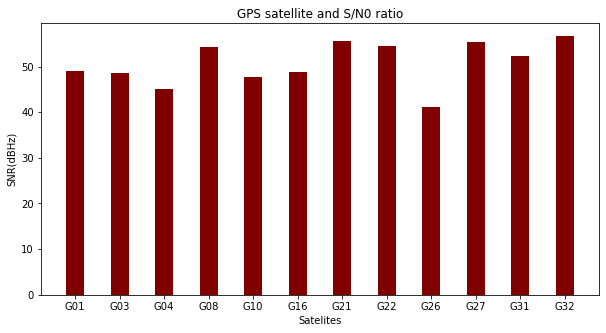

In [7]:
fig = plt.figure(figsize=(10, 5))
# bar plot
plt.bar(RoverFile['SAT'],RoverFile['SNR(dBHz)'], color = 'maroon', width= 0.4)
plt.xlabel('Satelites')
plt.ylabel('SNR(dBHz)')
plt.title('GPS satellite and S/N0 ratio')
plt.show()

In [8]:
GloRoverFile = pd.read_fwf('Data/SNR_EL_MP_0degGLO_rover29_5.txt')
GloRoverFile.head()

GalRoverFile = pd.read_fwf('Data/SNR_EL_MP_0degEGN_rover29_5.txt')

BDSRoverFile = pd.read_fwf('Data/SNR_EL_MP_0degBDS_rover29_5.txt')

In [9]:
az = np.radians(RoverFile['AZ(deg)'])
el = RoverFile['EL(deg)']
times = RoverFile['% TIME (GPST)']
len(times)

GloAz = np.radians(GloRoverFile['AZ(deg)'])
GloEl = GloRoverFile['EL(deg)']

GalAz = np.radians(GalRoverFile['AZ(deg)'])
GalEl = GalRoverFile['EL(deg)']

BDSAz = np.radians(BDSRoverFile['AZ(deg)'])
BDSEl = BDSRoverFile['EL(deg)']

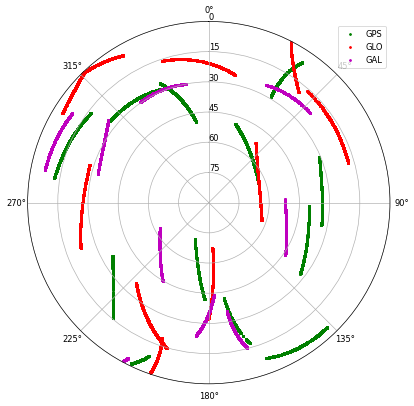

In [10]:
# Plot sky plot
fig = plt.figure(figsize=(8,8), dpi=60)

# Coordinate system to polar coordinate
ax = fig.add_subplot(111, projection='polar')

# Angle 0 starts from the North
ax.set_theta_zero_location('N')

# Change direction to clockwise
ax.set_theta_direction(-1)
ax.set_ylim(90, 0)
# Increase yticks by 15
ax.set_yticks(range(0, 90, 15))
# Set the position of the label to 0 
ax.set_rlabel_position(0)
plt.scatter(az, el, s=5, c='g', marker='o', label='GPS')
plt.scatter(GloAz, GloEl, s=5, c='r', marker='o', label='GLO')
plt.scatter(GalAz, GalEl, s=5, c='m', marker='o', label='GAL')
plt.legend(loc='best')
ax.grid(True)
plt.show()

In [11]:
# Import Satellite and DOP file for each constellation
SatDopFile = pd.read_fwf('Data/Sats_Dop_ALL29_5.txt')
GpsSatDopFile = pd.read_fwf('Data/Sats_Dop_GPS29_5.txt')
GloSatDopFile = pd.read_fwf('Data/Sats_Dop_GLO29_5.txt')
BdsSatDopFile = pd.read_fwf('Data/Sats_Dop_BDS29_5.txt')
GalSatDopFile = pd.read_fwf('Data/Sats_Dop_GAL29_5.txt')
SatDopFile.head()

,% TIME (GPST),NSAT,GDOP,PDOP,HDOP,VDOP,(EL>=0deg)
0,2022/05/29 13:51:35.4,31,1.1,1.0,0.4,0.9,NaN
1,2022/05/29 13:51:36.4,33,1.0,0.9,0.4,0.8,NaN
2,2022/05/29 13:51:37.4,30,1.2,1.1,0.5,1.0,NaN
3,2022/05/29 13:51:38.4,30,1.2,1.1,0.5,1.0,NaN
4,2022/05/29 13:51:39.4,31,1.1,1.0,0.4,0.8,NaN


In [12]:

# Extract time column
SatTime = SatDopFile['% TIME (GPST)']

from datetime import datetime

# The format in which the string represents a date and time
date_format = "%Y/%m/%d %H:%M:%S.%f"

date_time = []
for i in range(len(SatTime)):
    # Convert the string to a datetime object
    date = datetime.strptime(SatTime[i], date_format)
    # Extract the time from the datetime object
    #date = date.strftime('%X')
    date_time.append(date)

# Print the result
print(date_time) 

[datetime.datetime(2022, 5, 29, 13, 51, 35, 400000), datetime.datetime(2022, 5, 29, 13, 51, 36, 400000), datetime.datetime(2022, 5, 29, 13, 51, 37, 400000), datetime.datetime(2022, 5, 29, 13, 51, 38, 400000), datetime.datetime(2022, 5, 29, 13, 51, 39, 400000), datetime.datetime(2022, 5, 29, 13, 51, 40, 400000), datetime.datetime(2022, 5, 29, 13, 51, 41, 400000), datetime.datetime(2022, 5, 29, 13, 51, 42, 400000), datetime.datetime(2022, 5, 29, 13, 51, 43, 400000), datetime.datetime(2022, 5, 29, 13, 51, 44, 400000), datetime.datetime(2022, 5, 29, 13, 51, 45, 400000), datetime.datetime(2022, 5, 29, 13, 51, 46, 400000), datetime.datetime(2022, 5, 29, 13, 51, 47, 400000), datetime.datetime(2022, 5, 29, 13, 51, 48, 400000), datetime.datetime(2022, 5, 29, 13, 51, 49, 400000), datetime.datetime(2022, 5, 29, 13, 51, 50, 400000), datetime.datetime(2022, 5, 29, 13, 51, 51, 400000), datetime.datetime(2022, 5, 29, 13, 51, 52, 400000), datetime.datetime(2022, 5, 29, 13, 51, 53, 400000), datetime.da

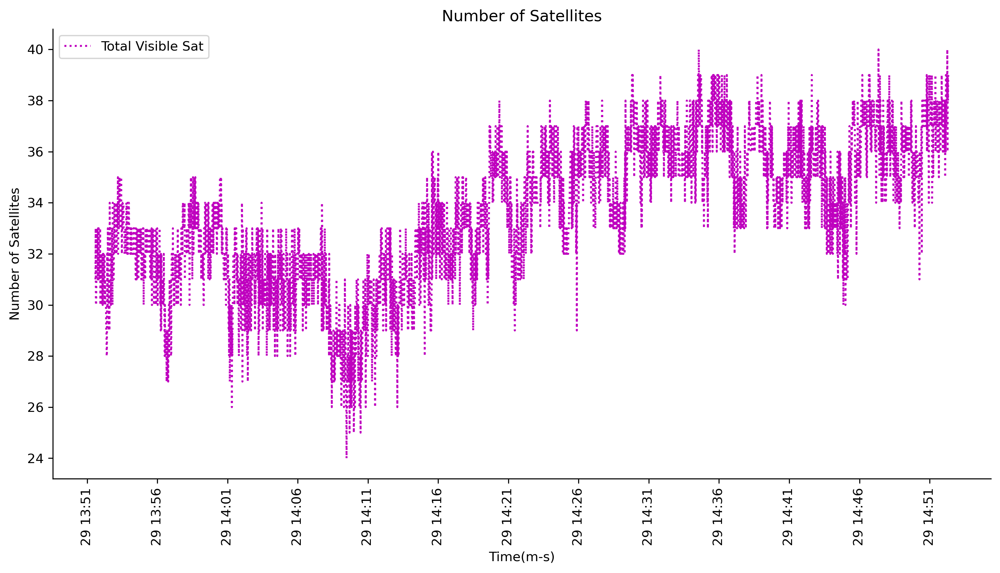

In [14]:
import matplotlib.dates as mdates

NumOfSat = SatDopFile['NSAT']
GpsNumOfSat = GpsSatDopFile['NSAT']
GloNumOfSat = GloSatDopFile['NSAT']
BdsNumOfSat = BdsSatDopFile['NSAT']
GalNumOfSat = GalSatDopFile['NSAT']

fig = plt.figure(figsize=(20,6), dpi=300)

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)


plt.plot(date_time, NumOfSat, 'm:', label='Total Visible Sat' )

plt.title('Number of Satellites')
plt.xlabel('Time(m-s)')
plt.ylabel('Number of Satellites')
plt.legend(loc='best')

# Plot the time every 2 minutes on the X-axis
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=5))
# Plot the X-axis data label in a 90 degree angle
plt.xticks(rotation=90)
plt.show()

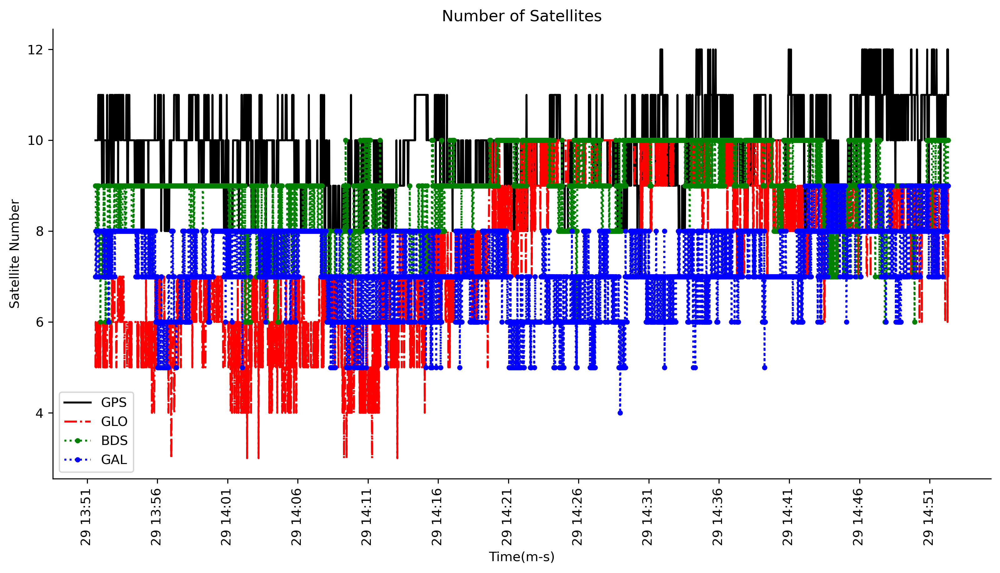

In [15]:
fig = plt.figure(figsize=(20,6), dpi=300)

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)


plt.plot(date_time, GpsNumOfSat, 'k-', label='GPS' )
plt.plot(date_time, GloNumOfSat, 'r-.', label='GLO' )
plt.plot(date_time, BdsNumOfSat, 'g:.', label='BDS' )
plt.plot(date_time, GalNumOfSat, 'b:.', label='GAL' )

plt.title('Number of Satellites')
plt.xlabel('Time(m-s)')
plt.ylabel('Satellite Number')
plt.legend(loc='best')
# Plot the time every 2 minutes on the X-axis
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=5))
# Plot the X-axis data label in a 90 degree angle
plt.xticks(rotation=90)
plt.show()

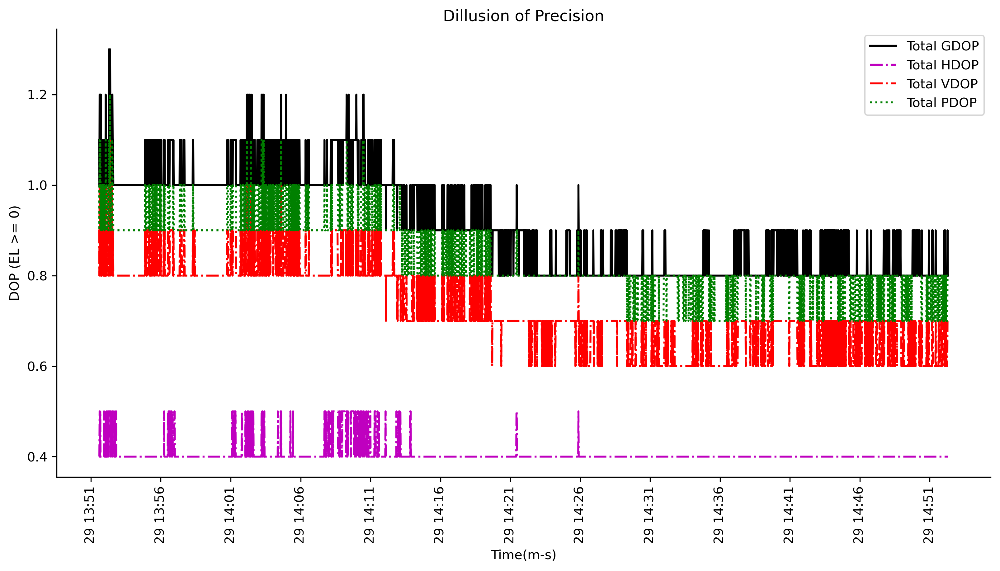

In [16]:

AllGDOP = SatDopFile['GDOP']
AllPDOP = SatDopFile['PDOP']
AllHDOP = SatDopFile['HDOP']
AllVDOP = SatDopFile['VDOP']

fig = plt.figure(figsize=(20,6), dpi=300)

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)


plt.plot(date_time, AllGDOP, 'k-', label='Total GDOP' )
plt.plot(date_time, AllHDOP, 'm-.', label='Total HDOP' )
plt.plot(date_time, AllVDOP, 'r-.', label='Total VDOP' )
plt.plot(date_time, AllPDOP, 'g:', label='Total PDOP' )

plt.title('Dillusion of Precision')
plt.xlabel('Time(m-s)')
plt.ylabel('DOP (EL >= 0)')
plt.legend(loc='best')
# Plot the time every 2 minutes on the X-axis
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=5))
# Plot the X-axis data label in a 90 degree angle
plt.xticks(rotation=90)
plt.show()

### Rover Static Positioning

In [17]:
RoverData = pd.read_fwf("Data/roverStaticObs0529.pos", skiprows = 13)

In [18]:
# Rename unnamed column
RoverData.rename(columns = {'Unnamed: 1':'time'}, inplace = True)

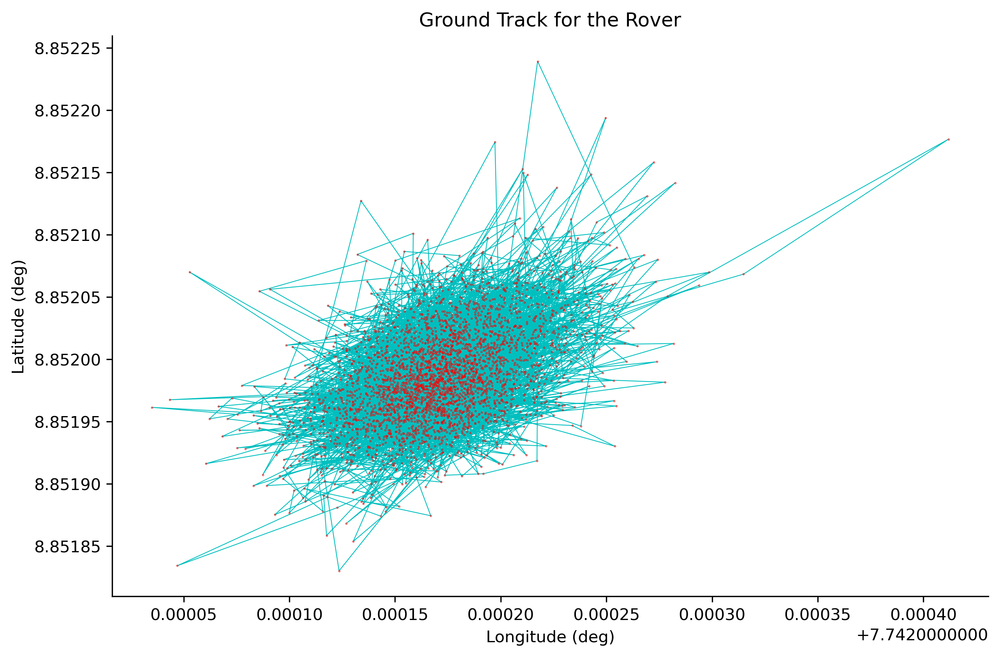

In [19]:
plt.figure(figsize=(15,6), dpi=300)

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.plot(RoverData['longitude(deg)'], RoverData['latitude(deg)'], 'c-', zorder=0, linewidth = 0.5)
plt.plot(RoverData['longitude(deg)'], RoverData['latitude(deg)'], 'r.', zorder=1, markersize = 0.5)
#plt.ylim(8.7, 8.9)
#plt.xlim(7.7, 10)
plt.ylabel("Latitude (deg)")
plt.xlabel("Longitude (deg)")
plt.title('Ground Track for the Rover')

plt.show()

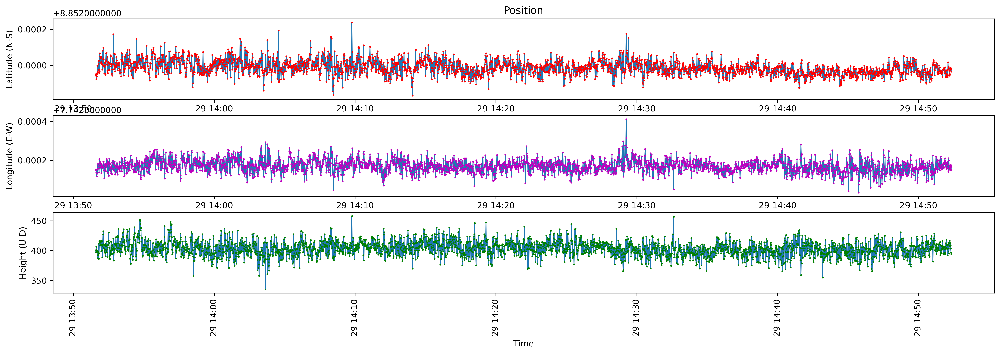

In [20]:

fig = plt.figure(figsize=(20,6), dpi=300)


plt.subplot(3,1,1)
plt.plot(date_time, RoverData['latitude(deg)'], linewidth = 1)
plt.plot(date_time, RoverData['latitude(deg)'], 'r.', markersize = 2)
plt.ylabel('Latitude (N-S)')
plt.title('Position')

#plt.plot(date_time, RoverData['sdn(m)'], 'b-')

plt.subplot(3,1,2)
plt.plot(date_time, RoverData['longitude(deg)'], linewidth = 1)
plt.plot(date_time, RoverData['longitude(deg)'], 'm.', markersize = 2)
plt.ylabel('Longitude (E-W)')

plt.subplot(3,1,3)
plt.plot(date_time, RoverData['height(m)'], linewidth = 1)
plt.plot(date_time, RoverData['height(m)'], 'g.', markersize = 2)
plt.ylabel('Height (U-D)')
plt.xlabel('Time')

# Plot the time every 2 minutes on the X-axis
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=2))
# Plot the X-axis data label in a 90 degree angle
plt.xticks(rotation=90)



plt.show()

c:\Users\Abdullateef\miniconda3\envs\tensorflowGPU2\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.2
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


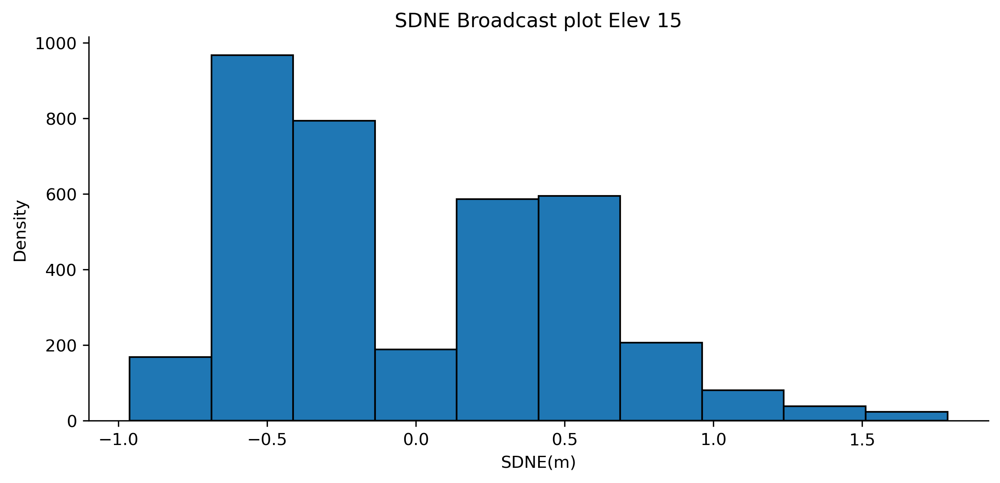

In [21]:
#import seaborn as sb
from scipy.stats import norm

mean = np.mean(RoverData['sdne(m)'])
sd = np.std(RoverData['sdne(m)'])
pdf = norm.pdf(RoverData['sdne(m)'], loc = mean, scale = sd)

plt.figure(figsize=(15,4), dpi=300)
#plt.style.use('_mpl-gallery')

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.hist(RoverData['sdne(m)'], edgecolor='black')
#plt.plot(RoverData['sdne(m)'], pdf, color = 'red')

plt.xlabel('SDNE(m)')
plt.ylabel('Density')
plt.title('SDNE Broadcast plot Elev 15')

plt.show()

### Single Positioning ELev "0"

In [22]:
RoverData_Elev = pd.read_fwf("Data/roverStaticObs0529_0Elev.pos", skiprows = 13)

In [23]:
RoverData_Elev.head()

,% GPST,Unnamed: 1,latitude(deg),longitude(deg),height(m),Q,ns,sdn(m),sde(m),sdu(m),sdne(m),sdeu(m),sdun(m),age(s),ratio
0,2022/05/29,13:51:35.421,8.851943,7.742157,399.7778,5,31,1.7247,1.8299,4.8018,0.3492,-1.5304,1.1980,0.0,0.0
1,2022/05/29,13:51:36.421,8.851950,7.742161,400.4534,5,33,1.7171,1.7526,4.3793,0.2521,-1.1683,1.2502,0.0,0.0
2,2022/05/29,13:51:37.421,8.851924,7.742139,407.4588,5,30,1.7278,1.8989,5.1167,0.2618,-1.7996,1.2726,0.0,0.0
3,2022/05/29,13:51:38.421,8.851941,7.742136,406.1620,5,30,1.7278,1.8989,5.1169,0.2616,-1.7997,1.2724,0.0,0.0
4,2022/05/29,13:51:39.421,8.851938,7.742126,401.0974,5,31,1.7249,1.8858,4.4591,0.3754,-1.1275,1.2148,0.0,0.0


In [24]:
RoverData_Elev.rename(columns={'Unnamed: 1': 'time_1'}, inplace= True )
RoverData_Elev.head()

,% GPST,time_1,latitude(deg),longitude(deg),height(m),Q,ns,sdn(m),sde(m),sdu(m),sdne(m),sdeu(m),sdun(m),age(s),ratio
0,2022/05/29,13:51:35.421,8.851943,7.742157,399.7778,5,31,1.7247,1.8299,4.8018,0.3492,-1.5304,1.1980,0.0,0.0
1,2022/05/29,13:51:36.421,8.851950,7.742161,400.4534,5,33,1.7171,1.7526,4.3793,0.2521,-1.1683,1.2502,0.0,0.0
2,2022/05/29,13:51:37.421,8.851924,7.742139,407.4588,5,30,1.7278,1.8989,5.1167,0.2618,-1.7996,1.2726,0.0,0.0
3,2022/05/29,13:51:38.421,8.851941,7.742136,406.1620,5,30,1.7278,1.8989,5.1169,0.2616,-1.7997,1.2724,0.0,0.0
4,2022/05/29,13:51:39.421,8.851938,7.742126,401.0974,5,31,1.7249,1.8858,4.4591,0.3754,-1.1275,1.2148,0.0,0.0


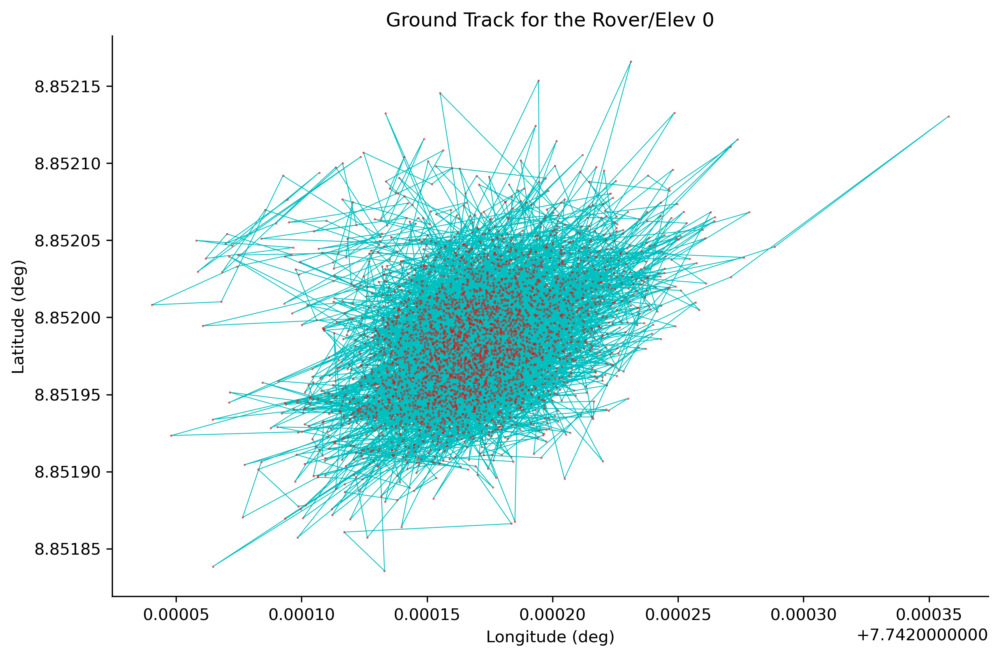

In [25]:
plt.figure(figsize=(15,6), dpi=300)

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.plot(RoverData_Elev['longitude(deg)'], RoverData_Elev['latitude(deg)'], 'c-', zorder=0, linewidth = 0.5)
plt.plot(RoverData_Elev['longitude(deg)'], RoverData_Elev['latitude(deg)'], 'r.', zorder=1, markersize = 0.5)
#plt.ylim(8.7, 8.9)
#plt.xlim(7.7, 10)
plt.ylabel("Latitude (deg)")
plt.xlabel("Longitude (deg)")
plt.title('Ground Track for the Rover/Elev 0')

plt.show()

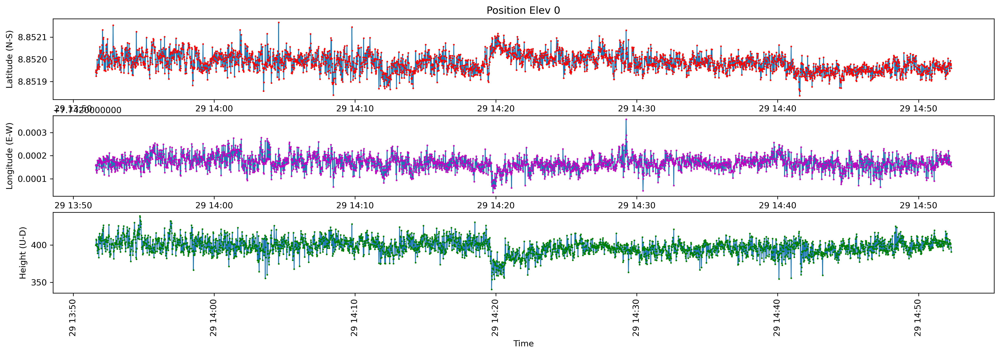

In [26]:
fig = plt.figure(figsize=(20,6), dpi=300)


plt.subplot(3,1,1)
plt.plot(date_time, RoverData_Elev['latitude(deg)'], linewidth = 1)
plt.plot(date_time, RoverData_Elev['latitude(deg)'], 'r.', markersize = 2)
plt.ylabel('Latitude (N-S)')
plt.title('Position Elev 0')

#plt.plot(date_time, RoverData['sdn(m)'], 'b-')

plt.subplot(3,1,2)
plt.plot(date_time, RoverData_Elev['longitude(deg)'], linewidth = 1)
plt.plot(date_time, RoverData_Elev['longitude(deg)'], 'm.', markersize = 2)
plt.ylabel('Longitude (E-W)')

plt.subplot(3,1,3)
plt.plot(date_time, RoverData_Elev['height(m)'], linewidth = 1)
plt.plot(date_time, RoverData_Elev['height(m)'], 'g.', markersize = 2)
plt.ylabel('Height (U-D)')
plt.xlabel('Time')

# Plot the time every 2 minutes on the X-axis
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=2))
# Plot the X-axis data label in a 90 degree angle
plt.xticks(rotation=90)


plt.show()

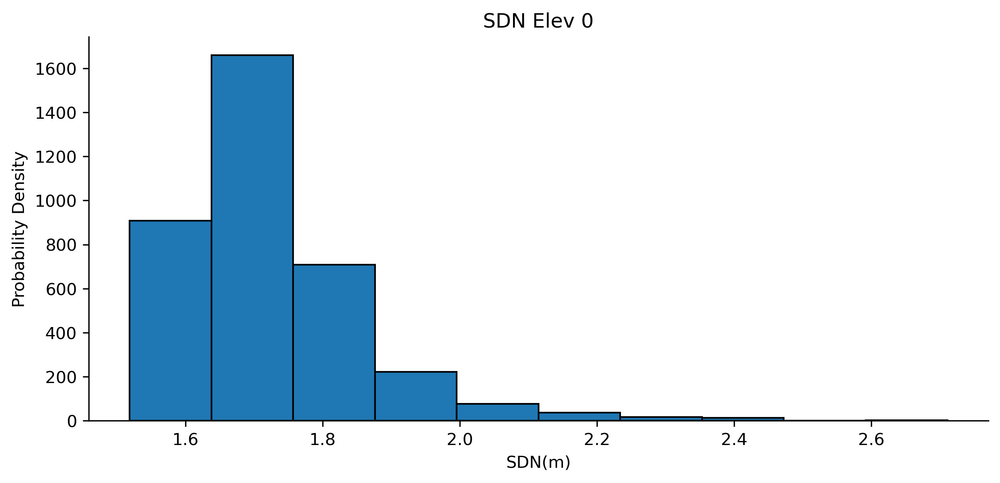

In [27]:
mean = np.mean(RoverData_Elev['sdn(m)'])
sd = np.std(RoverData_Elev['sdn(m)'])
pdf = norm.pdf(RoverData_Elev['sdn(m)'], loc = mean, scale = sd)

plt.figure(figsize=(15,4), dpi=300)
#plt.style.use('_mpl-gallery')

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.hist(RoverData_Elev['sdn(m)'], edgecolor='black')
#plt.plot(RoverData['sdne(m)'], pdf, color = 'red')

plt.xlabel('SDN(m)')
plt.ylabel('Probability Density')
plt.title('SDN Elev 0')

plt.show()

In [34]:
# Import Satellite and DOP file for each constellation (15 deg Elev)
SatDopFile15 = pd.read_fwf('Data/RoverSats_Dop_ALL29_5_15Elev.txt')
GpsSatDopFile15 = pd.read_fwf('Data/RoverSats_Dop_GPS29_5_15Elev.txt')
GloSatDopFile15 = pd.read_fwf('Data/RoverSats_Dop_GLO29_5_15Elev.txt')
BdsSatDopFile15 = pd.read_fwf('Data/RoverSats_Dop_BDS29_5_15Elev.txt')
GalSatDopFile15 = pd.read_fwf('Data/RoverSats_Dop_GAL29_5_15Elev.txt')
SatDopFile15.head()

,% TIME (GPST),NSAT,GDOP,PDOP,HDOP,VDOP,(EL>=15deg)
0,2022/05/29 13:51:35.4,28,1.3,1.2,0.5,1.1,NaN
1,2022/05/29 13:51:36.4,30,1.2,1.1,0.5,1.0,NaN
2,2022/05/29 13:51:37.4,28,1.3,1.2,0.5,1.1,NaN
3,2022/05/29 13:51:38.4,28,1.3,1.2,0.5,1.1,NaN
4,2022/05/29 13:51:39.4,28,1.3,1.1,0.5,1.0,NaN


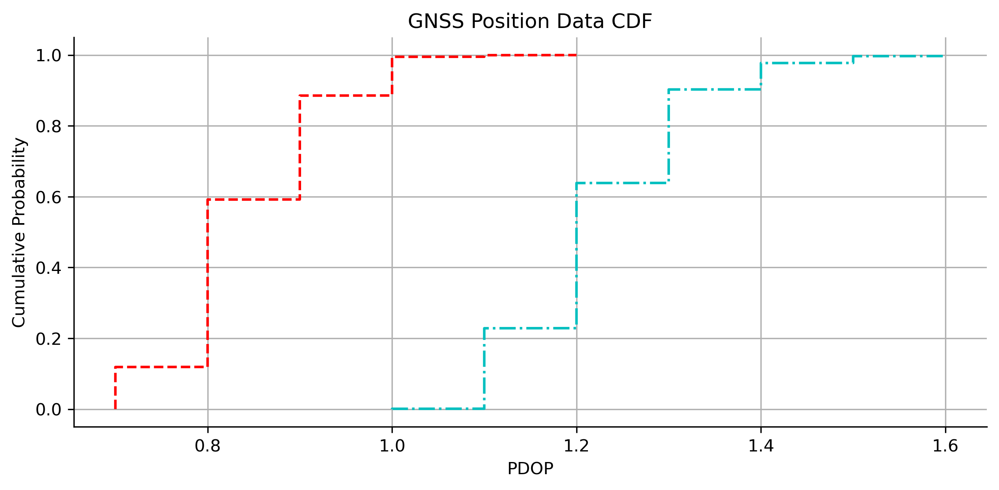

In [39]:
# CDF Plot
#CDF_data = RoverData_Elev['sdne(m)']
# CDF Plot
CDF_PDOP0 = AllPDOP
CDF_PDOP15 = SatDopFile15['PDOP']

sortedCDF_PDOP0 = np.sort(CDF_PDOP0)
yvals_PDOP0 = np.arange(len(sortedCDF_PDOP0))/ float(len(sortedCDF_PDOP0))

sortedCDF_PDOP15 = np.sort(CDF_PDOP15)
yvals_PDOP15 = np.arange(len(sortedCDF_PDOP15))/ float(len(sortedCDF_PDOP15))

# plot CDF
plt.figure(figsize=(15,4), dpi=300)

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.plot(sortedCDF_PDOP0, yvals_PDOP0, 'r--')
plt.plot(sortedCDF_PDOP15, yvals_PDOP15, 'c-.')
plt.xlabel('PDOP')
plt.ylabel('Cumulative Probability')
plt.title('GNSS Position Data CDF')
plt.grid(True)
plt.show()

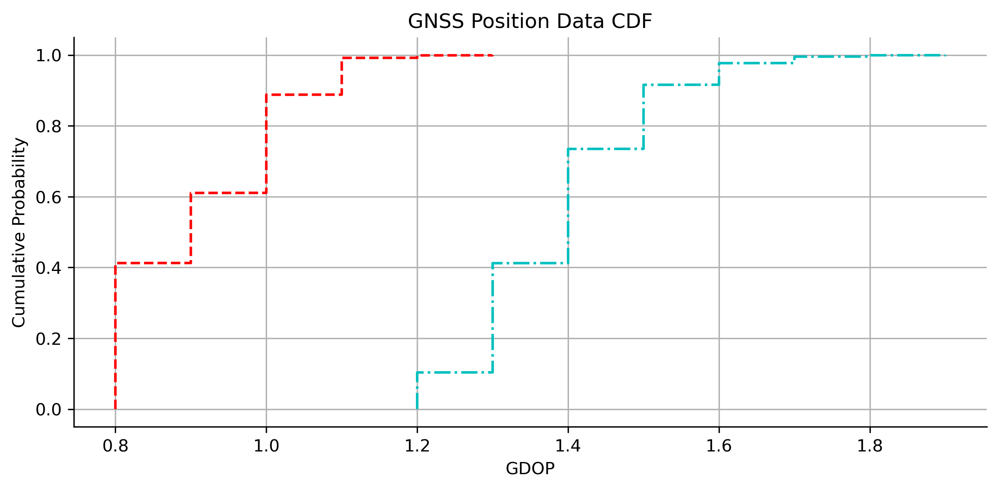

In [41]:
CDF_GDOP0 = SatDopFile['GDOP']
CDF_GDOP15 = SatDopFile15['GDOP']

sortedCDF_GDOP0 = np.sort(CDF_GDOP0)
yvals_GDOP0 = np.arange(len(sortedCDF_GDOP0))/ float(len(sortedCDF_GDOP0))

sortedCDF_GDOP15 = np.sort(CDF_GDOP15)
yvals_GDOP15 = np.arange(len(sortedCDF_GDOP15))/ float(len(sortedCDF_GDOP15))

# plot CDF
plt.figure(figsize=(15,4), dpi=300)

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.plot(sortedCDF_GDOP0, yvals_GDOP0, 'r--')
plt.plot(sortedCDF_GDOP15, yvals_GDOP15, 'c-.')
plt.xlabel('GDOP')
plt.ylabel('Cumulative Probability')
plt.title('GNSS Position Data CDF')
plt.grid(True)
plt.show()

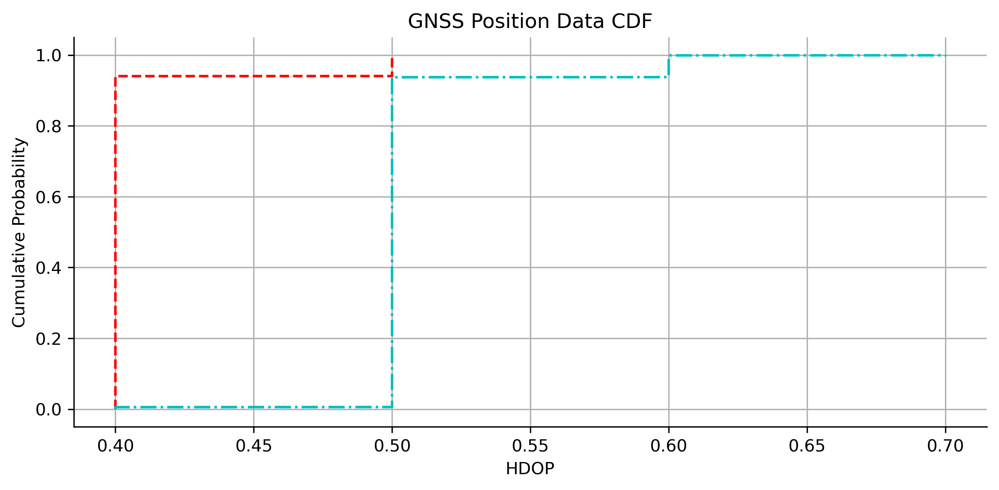

In [42]:
CDF_HDOP0 = SatDopFile['HDOP']
CDF_HDOP15 = SatDopFile15['HDOP']

sortedCDF_HDOP0 = np.sort(CDF_HDOP0)
yvals_HDOP0 = np.arange(len(sortedCDF_HDOP0))/ float(len(sortedCDF_HDOP0))

sortedCDF_HDOP15 = np.sort(CDF_HDOP15)
yvals_HDOP15 = np.arange(len(sortedCDF_HDOP15))/ float(len(sortedCDF_HDOP15))

# plot CDF
plt.figure(figsize=(15,4), dpi=300)

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.plot(sortedCDF_HDOP0, yvals_HDOP0, 'r--')
plt.plot(sortedCDF_HDOP15, yvals_HDOP15, 'c-.')
plt.xlabel('HDOP')
plt.ylabel('Cumulative Probability')
plt.title('GNSS Position Data CDF')
plt.grid(True)
plt.show()

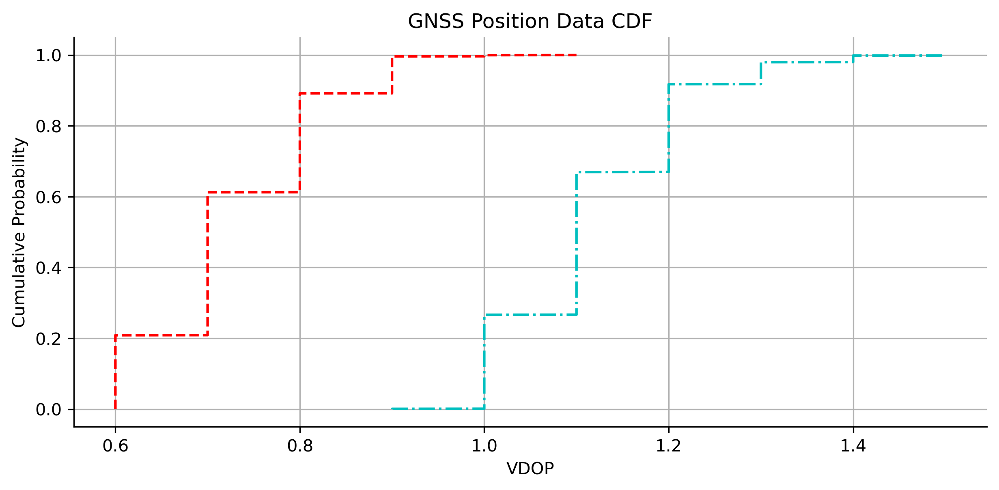

In [43]:
CDF_VDOP0 = SatDopFile['VDOP']
CDF_VDOP15 = SatDopFile15['VDOP']

sortedCDF_VDOP0 = np.sort(CDF_VDOP0)
yvals_VDOP0 = np.arange(len(sortedCDF_VDOP0))/ float(len(sortedCDF_VDOP0))

sortedCDF_VDOP15 = np.sort(CDF_VDOP15)
yvals_VDOP15 = np.arange(len(sortedCDF_VDOP15))/ float(len(sortedCDF_VDOP15))

# plot CDF
plt.figure(figsize=(15,4), dpi=300)

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.plot(sortedCDF_VDOP0, yvals_VDOP0, 'r--')
plt.plot(sortedCDF_VDOP15, yvals_VDOP15, 'c-.')
plt.xlabel('VDOP')
plt.ylabel('Cumulative Probability')
plt.title('GNSS Position Data CDF')
plt.grid(True)
plt.show()

### Single Positioning ELev "30"

In [29]:
RoverData_Elev20 = pd.read_fwf("Data/roverStaticObs0529_20Elev.pos", skiprows = 13)
RoverData_Elev20.head()

,% GPST,Unnamed: 1,latitude(deg),longitude(deg),height(m),Q,ns,sdn(m),sde(m),sdu(m),sdne(m),sdeu(m),sdun(m),age(s),ratio
0,2022/05/29,13:51:35.421,8.851943,7.742142,401.3251,5,23,1.9955,2.2051,6.3503,0.7794,-1.2564,1.9431,0.0,0.0
1,2022/05/29,13:51:36.421,8.851934,7.742144,402.5858,5,24,1.9940,2.1462,5.7358,0.8033,-0.4467,1.8892,0.0,0.0
2,2022/05/29,13:51:37.421,8.851927,7.742150,403.5654,5,23,1.9953,2.2051,6.3505,0.7791,-1.2569,1.9424,0.0,0.0
3,2022/05/29,13:51:38.421,8.851945,7.742158,401.8124,5,23,1.9952,2.2051,6.3507,0.7789,-1.2571,1.9420,0.0,0.0
4,2022/05/29,13:51:39.421,8.851940,7.742132,394.4860,5,24,1.9937,2.1462,5.7364,0.8027,-0.4482,1.8885,0.0,0.0


In [30]:
RoverData_Elev20.rename(columns= {'Unnamed: 1' : 'time_2'}, inplace=True)
RoverData_Elev20.head()

,% GPST,time_2,latitude(deg),longitude(deg),height(m),Q,ns,sdn(m),sde(m),sdu(m),sdne(m),sdeu(m),sdun(m),age(s),ratio
0,2022/05/29,13:51:35.421,8.851943,7.742142,401.3251,5,23,1.9955,2.2051,6.3503,0.7794,-1.2564,1.9431,0.0,0.0
1,2022/05/29,13:51:36.421,8.851934,7.742144,402.5858,5,24,1.9940,2.1462,5.7358,0.8033,-0.4467,1.8892,0.0,0.0
2,2022/05/29,13:51:37.421,8.851927,7.742150,403.5654,5,23,1.9953,2.2051,6.3505,0.7791,-1.2569,1.9424,0.0,0.0
3,2022/05/29,13:51:38.421,8.851945,7.742158,401.8124,5,23,1.9952,2.2051,6.3507,0.7789,-1.2571,1.9420,0.0,0.0
4,2022/05/29,13:51:39.421,8.851940,7.742132,394.4860,5,24,1.9937,2.1462,5.7364,0.8027,-0.4482,1.8885,0.0,0.0


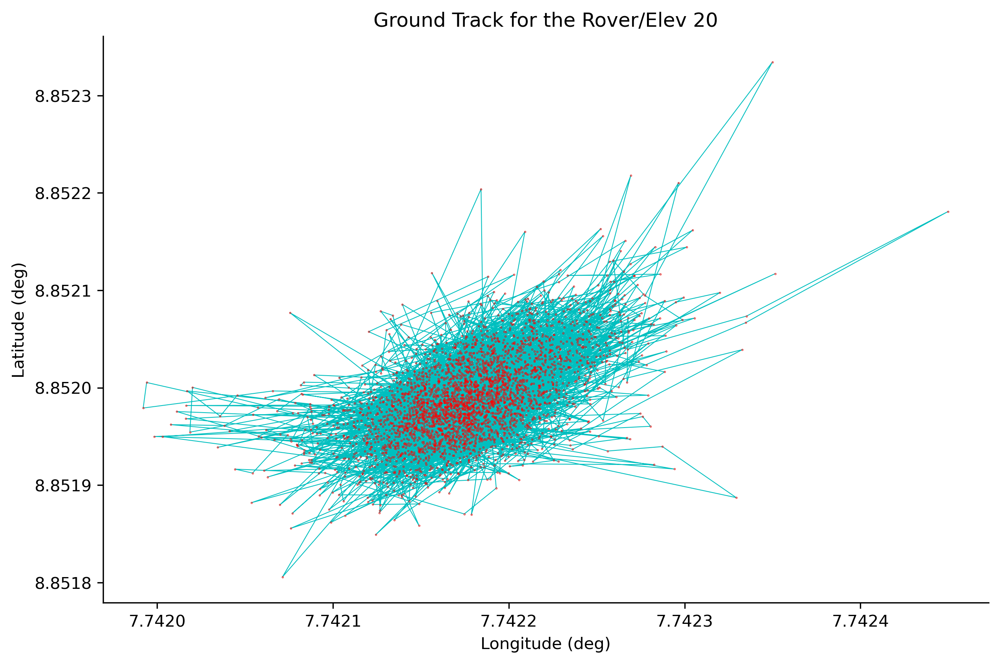

In [31]:
plt.figure(figsize=(15,6), dpi=300)

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.plot(RoverData_Elev20['longitude(deg)'], RoverData_Elev20['latitude(deg)'], 'c-', zorder=0, linewidth = 0.5)
plt.plot(RoverData_Elev20['longitude(deg)'], RoverData_Elev20['latitude(deg)'], 'r.', zorder=1, markersize = 0.5)
#plt.ylim(8.7, 8.9)
#plt.xlim(7.7, 10)
plt.ylabel("Latitude (deg)")
plt.xlabel("Longitude (deg)")
plt.title('Ground Track for the Rover/Elev 20')

plt.show()

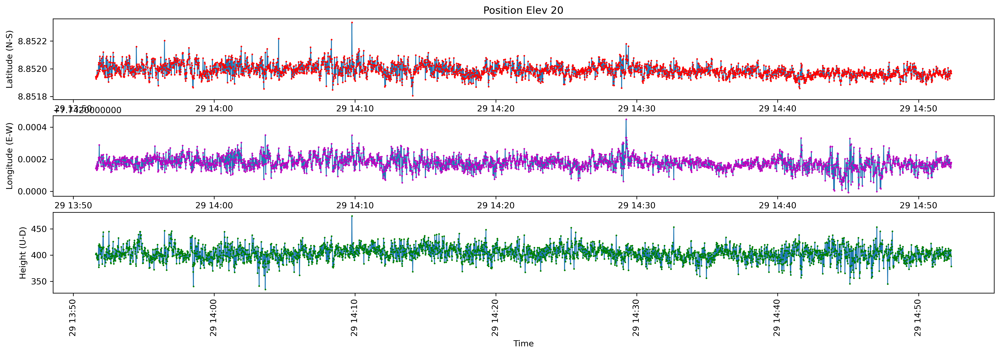

In [32]:
fig = plt.figure(figsize=(20,6), dpi=300)


plt.subplot(3,1,1)
plt.plot(date_time, RoverData_Elev20['latitude(deg)'], linewidth = 1)
plt.plot(date_time, RoverData_Elev20['latitude(deg)'], 'r.', markersize = 2)
plt.ylabel('Latitude (N-S)')
plt.title('Position Elev 20')

#plt.plot(date_time, RoverData['sdn(m)'], 'b-')

plt.subplot(3,1,2)
plt.plot(date_time, RoverData_Elev20['longitude(deg)'], linewidth = 1)
plt.plot(date_time, RoverData_Elev20['longitude(deg)'], 'm.', markersize = 2)
plt.ylabel('Longitude (E-W)')

plt.subplot(3,1,3)
plt.plot(date_time, RoverData_Elev20['height(m)'], linewidth = 1)
plt.plot(date_time, RoverData_Elev20['height(m)'], 'g.', markersize = 2)
plt.ylabel('Height (U-D)')
plt.xlabel('Time')

# Plot the time every 2 minutes on the X-axis
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=2))
# Plot the X-axis data label in a 90 degree angle
plt.xticks(rotation=90)


plt.show()

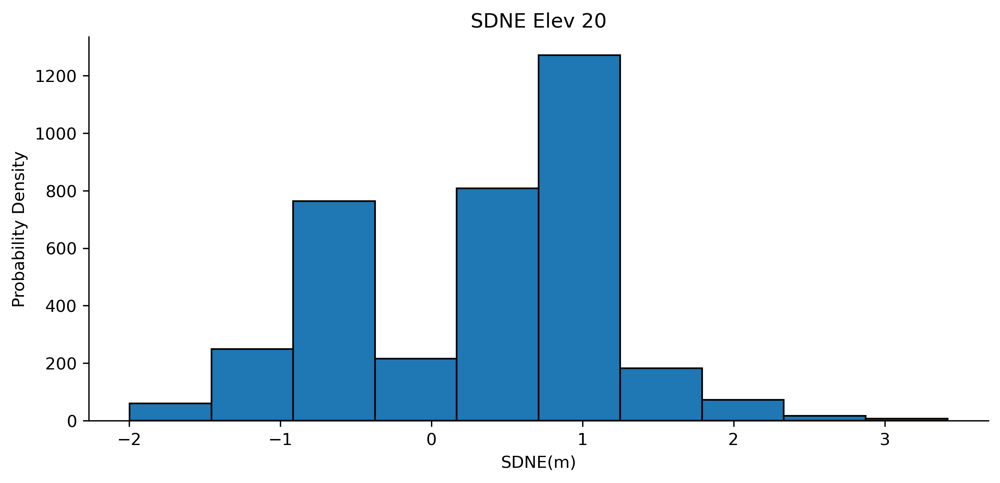

In [33]:
mean = np.mean(RoverData_Elev20['sdne(m)'])
sd = np.std(RoverData_Elev20['sdne(m)'])
pdf = norm.pdf(RoverData_Elev20['sdne(m)'], loc = mean, scale = sd)

plt.figure(figsize=(15,4), dpi=300)
#plt.style.use('_mpl-gallery')

ax = plt.axes((0.1,0.1,0.5,0.8))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.hist(RoverData_Elev20['sdne(m)'], edgecolor='black')
#plt.plot(RoverData['sdne(m)'], pdf, color = 'red')

plt.xlabel('SDNE(m)')
plt.ylabel('Probability Density')
plt.title('SDNE Elev 20')

plt.show()